# Data augmentation

CNN data augmentation enhances model robustness by introducing small random variations into existing images, preventing overfitting, improving generalization, and increasing data volume. Dataset augmentation boosts object recognition effectiveness.



## Techniques

### Image Data Augmentation

High-dimensional images encompass diverse variations, easily simulated. Pixel translation in training images often improves generalization [2](https://www.deeplearningbook.org/contents/convnets.html).

Image data augmentation is a common method with CNNs, involving techniques such as:

+ Rotation (at 90 degrees and finer angles)
+ Flips
+ Translation
+ Scaling
+ Salt and Pepper noise addition
[4](https://nnart.org/what-is-data-augmentation-in-a-cnn/)

#### Rotation



**Rotation**, a common augmentation technique, varies angles for diverse data. To maintain consistency, a fixed background color is used to prevent the model from treating background changes as features. This is particularly effective when the background remains constant across all rotated images.

$$
\boldsymbol{R} = \begin{bmatrix}\cos \theta &-\sin \theta \\\sin \theta &\cos \theta \end{bmatrix}
$$


$$
\boldsymbol{R\mathbf {v}} = \begin{bmatrix}\cos \theta &-\sin \theta \\\sin \theta &\cos \theta \end{bmatrix}{\begin{bmatrix}x\\y\end{bmatrix}}=\begin{bmatrix}x\cos \theta -y\sin \theta \\x\sin \theta +y\cos \theta \end{bmatrix}
$$


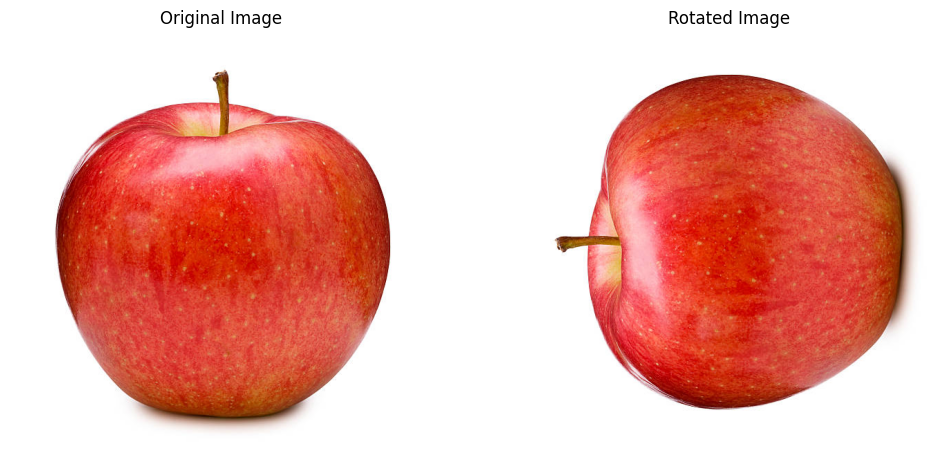

In [1]:
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO

input_image_url = 'https://media.istockphoto.com/id/184276818/photo/red-apple.jpg?s=612x612&w=0&k=20&c=NvO-bLsG0DJ_7Ii8SSVoKLurzjmV0Qi4eGfn6nW3l5w='

def load_image_from_url(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content))
image = load_image_from_url(input_image_url)

# Rotating (example: 90 degrees)
rotated_image = image.rotate(90)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(rotated_image)
plt.title('Rotated Image')
plt.axis('off')

plt.show()

$$
\mathbf{Rv} =
\begin{bmatrix}
    \cos \pi/2 & -\sin \pi/2 \\
    \sin \pi/2 & \cos \pi/2
\end{bmatrix}
\begin{bmatrix}
    2 \\
    3
\end{bmatrix}
=
\begin{bmatrix}
    x \cos \pi/2 - y \sin \pi/2 \\
    x \sin \pi/2 + y \cos \pi/2
\end{bmatrix}
$$

In [2]:
#hide-input

from jupyterquiz import display_quiz
display_quiz("sample_data/matrix.json")

FileNotFoundError: [Errno 2] No such file or directory: 'sample_data/matrix.json'

#### **Flips**

**Flipping** images prevents bias in the optimizer toward specific features on one side. This involves vertically or horizontally flipping the original training image, ensuring features vary in direction.

$$
\boldsymbol{F} = \begin{bmatrix} -1 & 0 \\ 0 & 1 \end{bmatrix}
$$



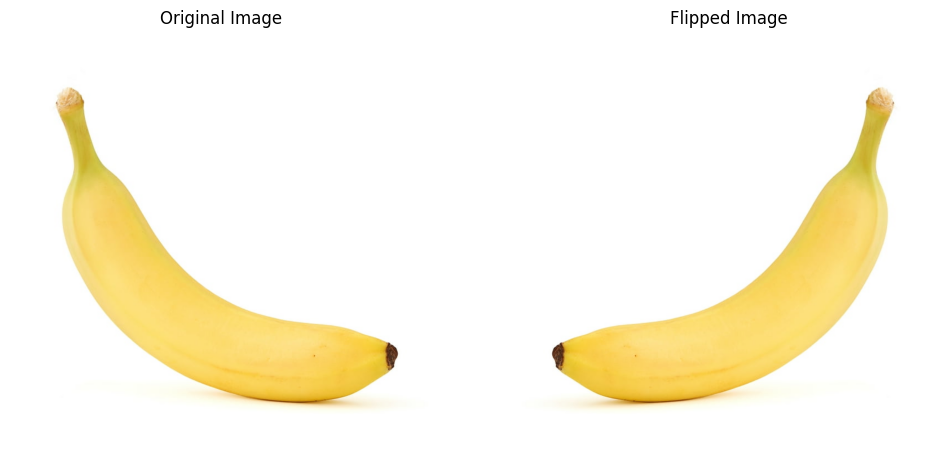

In [ ]:
input_image_url = 'https://i5.walmartimages.com/seo/Fresh-Banana-Fruit-Each_5939a6fa-a0d6-431c-88c6-b4f21608e4be.f7cd0cc487761d74c69b7731493c1581.jpeg?odnHeight=768&odnWidth=768&odnBg=FFFFFF'

image = load_image_from_url(input_image_url)

# Flipping
flipped_image = image.transpose(Image.FLIP_LEFT_RIGHT)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(flipped_image)
plt.title('Flipped Image')
plt.axis('off')

plt.show()

**Important Note** Do not use transformation that would change the correct class. For example, optical character recognition tasks require recognizing the difference between ‘b’ and ‘d’ and the difference between ‘6’ and ‘9’, so horizontal flips and 180◦ rotations are not appropriate ways of augmenting datasets for these tasks [2](https://www.deeplearningbook.org/contents/convnets.html)

In [ ]:
#hide-input

from jupyterquiz import display_quiz
display_quiz("sample_data/first.json")

<IPython.core.display.Javascript object>

#### Translation

**Translation** involves shifting the main object in an image in different directions.

$$
\boldsymbol{T} = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix}
$$

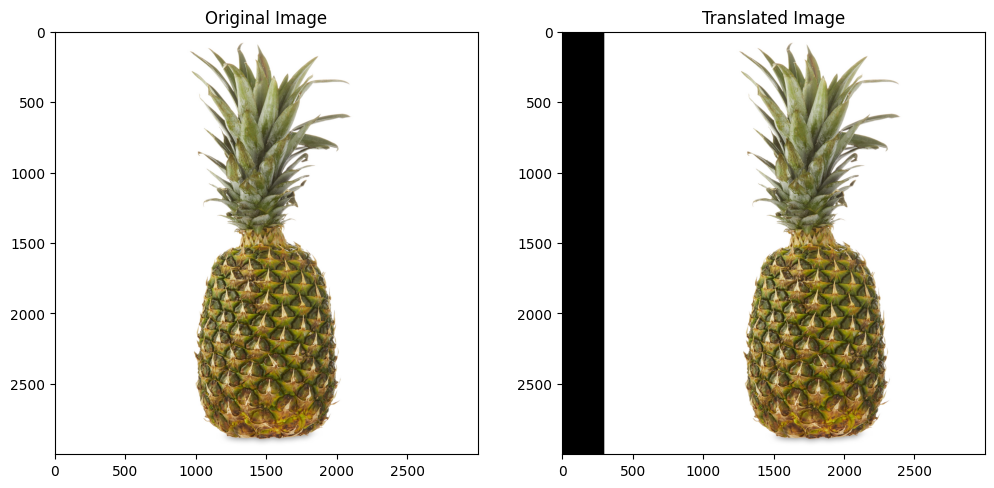

In [ ]:
input_image_url = 'https://i5.walmartimages.com/seo/Fresh-Pineapple-Each_1d2b3723-b31f-481d-ae30-c82fcbb59e20.d2e4de8d8b987f98a6e9da93a7e8c752.jpeg'

image = load_image_from_url(input_image_url)

def translation(image, translation_x, translation_y):
    translated_image = Image.new('RGB', image.size)
    translated_image.paste(image, (translation_x, translation_y))
    return translated_image

# Translation
translated_image = translation(image,300,0)

# Display images
plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(translated_image)
plt.title('Translated Image')

plt.show()

#### Scaling

**Scaling** provides more diversity in the training data of a machine learning model. It ensures object recognition regardless of zoom levels, accommodating both tiny central objects and zoomed-in images with cropping.

$$
\boldsymbol{S} = \begin{bmatrix} s_x & 0 \\ 0 & s_y \end{bmatrix}
$$

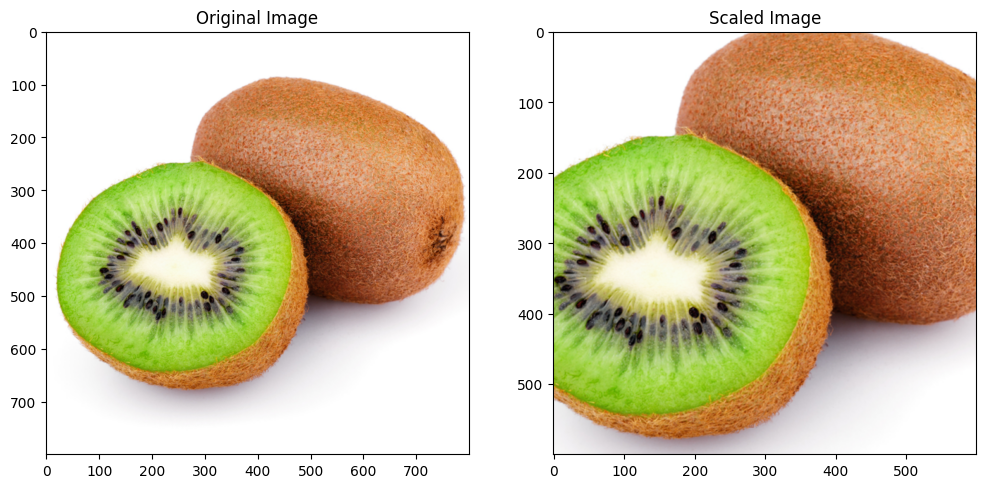

In [ ]:
input_image_url = 'https://freshsensations.com.au/cdn/shop/products/KiwiFruit.png?v=1643769428'

image = load_image_from_url(input_image_url)

# Set the size images
plt.figure(figsize=(12, 12))

# Display the original and scaled images
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 2, 2)

# Scaling (crop the center part)
plt.imshow(image.crop((100,100,image.width - 100, image.height - 100)))
plt.title('Scaled Image')

plt.show()


In [ ]:
#hide-input

from jupyterquiz import display_quiz
display_quiz("sample_data/questions.json")

<IPython.core.display.Javascript object>

#### Salt and Pepper Noise Addition

**Salt and pepper noise** produces random white and black pixels that resemble grains of salt and pepper, degrading image quality. This is often caused by transmission errors or sensor failures and can be simulated by randomly changing the pixels of an image.

$$
p(z) = \begin{cases}
    P_b & \text{for z = a}\\
    P_a & \text{for z = b}\\
    0 & \text{otherwise}
\end{cases}
$$

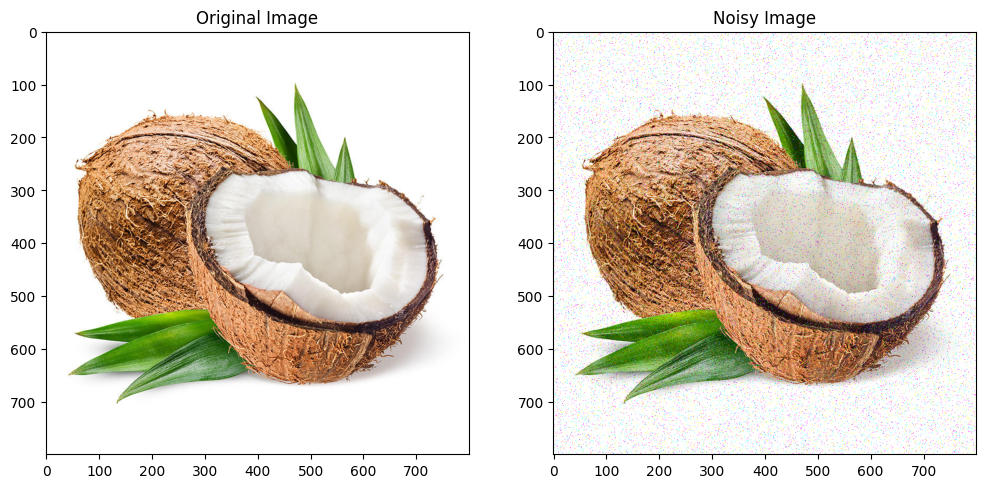

In [ ]:
import numpy as np

def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    img_array = np.array(image)
    salt_mask = np.random.rand(*img_array.shape) < salt_prob
    pepper_mask = np.random.rand(*img_array.shape) < pepper_prob
    img_array[salt_mask] = 255  # White pixels (salt)
    img_array[pepper_mask] = 0   # Black pixels (pepper)
    return Image.fromarray(img_array)

input_image_url = 'https://magnumopt.kz/upload/iblock/85f/85f3bc2a2eda0c7168df81b30e273242.png'
image = load_image_from_url(input_image_url)

# Set the probabilities for salt and pepper noise
salt_probability = 0.02  # Adjust as needed
pepper_probability = 0.02  # Adjust as needed

# Add salt-and-pepper noise
noisy_image = add_salt_and_pepper_noise(image, salt_probability, pepper_probability)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title('Noisy Image')

plt.show()


In [ ]:
#hide-input

from jupyterquiz import display_quiz
display_quiz("sample_data/second.json")

<IPython.core.display.Javascript object>

#### Image Augmentation Applications

Data augmentation can apply to all machine learning applications where acquiring quality data is challenging. Furthermore, it can help improve model robustness and performance across all fields of study [6](https://www.datacamp.com/tutorial/complete-guide-data-augmentation). There are some application examples.

##### Helthcare

Acquiring and labeling medical imaging datasets is time-consuming and expensive. You also need a subject matter expert to validate the dataset before performing data analysis. Using geometric and other transformations can help you train robust and accurate machine-learning models.

In pneumonia classification, various augmentation techniques can be employed to enhance model performance. However, caution should be exercised with certain augmentations, such as random rotation and reflection along the x-axis, as they may yield opposite results when dealing with X-ray images.

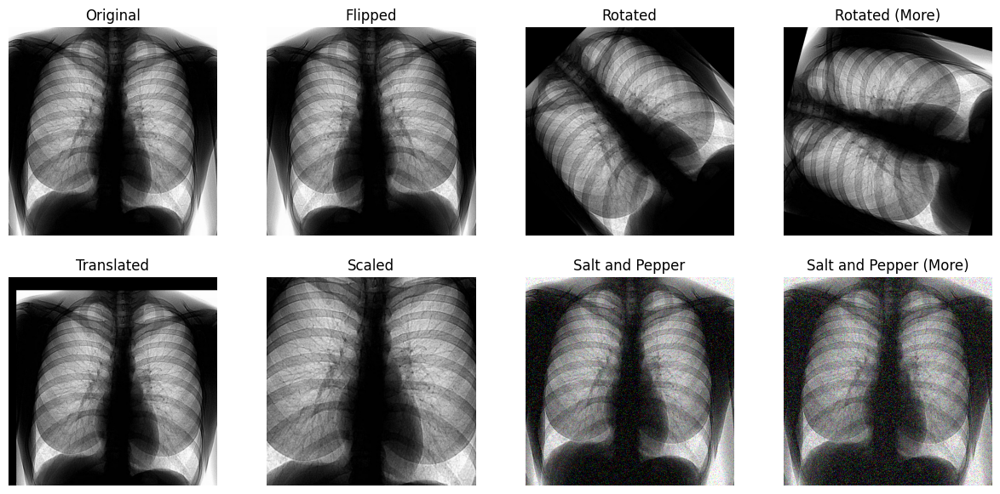

In [ ]:
def plot_images(images, titles, figsize=(15, 7)):
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(2, 4, i)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    plt.show()

# Specify the URL to your input image
input_image_url = 'https://lada-med.ru/assets/mgr/images/articles/fluoro1.jpg'

# Download the image from the URL
original_image = load_image_from_url(input_image_url)

# Image augmentations
flipped_image = original_image.transpose(Image.FLIP_LEFT_RIGHT)
rotated_image = original_image.rotate(45)
rotated_more_image = original_image.rotate(75)

# Translation
translated_image = translation(original_image,30,50)

# Scaling (crop the center part)
scaled_image = original_image.crop((100, 100, original_image.width - 100, original_image.height - 100))

# Salt and Pepper noise
salt_and_pepper_image1 = add_salt_and_pepper_noise(original_image, salt_prob=0.05, pepper_prob=0.05)

# Salt and Pepper noise (even more)
salt_and_pepper_image2 = add_salt_and_pepper_noise(original_image, salt_prob=0.1, pepper_prob=0.1)

# Display the images
images = [original_image, flipped_image, rotated_image, rotated_more_image, translated_image, scaled_image, salt_and_pepper_image1, salt_and_pepper_image2]
titles = ['Original', 'Flipped', 'Rotated', 'Rotated (More)', 'Translated', 'Scaled', 'Salt and Pepper', 'Salt and Pepper (More)']

plot_images(images, titles)

### Text Data Augmentation

Text data augmentation is generally used in situations with limited quality data, and improving the performance metric takes priority. You can apply synonym augmentation, word embedding, character swap, and random insertion and deletion. These techniques are also valuable for low-resource languages.

<img src = "https://images.datacamp.com/image/upload/v1669207732/Selective_Text_Augmentation_with_Word_Roles_for_Low_Resource_Text_Classification_c1302878c9.png" alt = "Natural Language Processing">

Researchers use text augmentation for the language models in high error recognition scenarios, sequence-to-sequence data generation, and text classification.

In [ ]:
import random
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize

def synonym_augmentation(sentence):
    words = word_tokenize(sentence)
    for i in range(len(words)):
        if random.uniform(0, 1) > 0.5:  # 50% probability for synonym replacement
            synonyms = get_synonyms(words[i])
            if synonyms:
                words[i] = random.choice(synonyms)
    
    return ' '.join(words)

def get_synonyms(word):
    synonyms = []
    for syn in wordnet.synsets(word):
        for lemma in syn.lemmas():
            synonyms.append(lemma.name())
    return list(set(synonyms))

def word_embedding_augmentation(sentence):
    # Implement word embedding augmentation if using a word embedding model
    # This may involve replacing words with their embeddings or using pre-trained embeddings

    # Placeholder for demonstration
    augmented_sentence = sentence
    return augmented_sentence

def character_swap_augmentation(sentence):
    words = word_tokenize(sentence)
    for i in range(len(words)):
        if len(words[i]) > 1:
            char_list = list(words[i])
            random.shuffle(char_list)
            words[i] = ''.join(char_list)
    
    return ' '.join(words)

def random_insertion_deletion_augmentation(sentence):
    words = word_tokenize(sentence)
    
    # Random insertion
    for _ in range(random.randint(0, 2)):
        random_word = "randomword"  # Replace with a function to generate a random word
        position = random.randint(0, len(words) - 1)
        words.insert(position, random_word)
    
    # Random deletion
    words = [word for word in words if random.uniform(0, 1) > 0.2]  # 80% probability to keep the word
    
    return ' '.join(words)

# Example usage
original_sentence = "Text data augmentation is generally used in situations with limited quality data, and improving the performance metric takes priority."
augmented_sentence = synonym_augmentation(original_sentence)
print("Original Sentence:", original_sentence)
print("Synonym Augmentation:", augmented_sentence)

augmented_sentence = character_swap_augmentation(original_sentence)
print("Character Swap Augmentation:", augmented_sentence)

augmented_sentence = random_insertion_deletion_augmentation(original_sentence)
print("Random Insertion and Deletion Augmentation:", augmented_sentence)


Original Sentence: Text data augmentation is generally used in situations with limited quality data, and improving the performance metric takes priority.
Synonym Augmentation: text_edition data augmentation make_up broadly_speaking secondhand in billet with limit select data , and improving the execution metric takes antecedence .
Character Swap Augmentation: etxT aatd iomteanagunt is ynlrglaee esdu ni iaiunttsso hwit idltime uyqtial dtaa , and gviipnomr het rcrnmfpaoee mirect satke iprritoy .
Random Insertion and Deletion Augmentation: Text data augmentation is generally used randomword with limited quality data the performance metric takes priority .


The possibilities of augmented data as a simulation are endless, as it can be used to generate real-world scenarios.

### Audio Data Augmentation

Audio Data Augmentation is a technique used in audio signal processing to extend and diversify the training data set. It entails controlled transformations on existing samples, creating new instances with essential characteristics but varied, employing techniques such as:

+ Time Stretching
+ Pitch Shifting
+ Noise Injection

In [ ]:
import librosa
import IPython.display as ipd
import plotly.graph_objs as go
from io import BytesIO
import requests

url = "https://drive.google.com/uc?id=1b39JkjCvagwY_bb83AfmXJvPShHt2e7v"
audio_data = requests.get(url).content
y, sr = librosa.load(BytesIO(audio_data), sr=None)

x = y[40000:80000]

trace_original = go.Scatter(x=list(range(len(x))), y=x, mode='lines', name='Original')

layout = go.Layout(title='Waveform Plot', xaxis=dict(title='Time (samples)'), yaxis=dict(title='Amplitude'))
fig = go.Figure(data=[trace_original], layout=layout)

fig.show()
ipd.Audio(x, rate=sr)

#### Time Stretching

The speed of audio playback can be adjusted without changing pitch or duration to simulate changes in the rhythm and speed of speech.

In [ ]:
y_stretch = librosa.effects.time_stretch(x, rate=1.5)
trace_stretched = go.Scatter(x=list(range(len(y_stretch))), y=y_stretch, mode='lines', name='Stretched')

layout_combined = go.Layout(title='Waveform Plot (Original and Time Stretching)', xaxis=dict(title='Time (samples)'), yaxis=dict(title='Amplitude'))
fig_combined = go.Figure(data=[trace_original, trace_stretched], layout=layout_combined)

fig_combined.show()
ipd.display(ipd.Audio(y_stretch, rate=sr))

#### Pitch Shifting

The pitch or frequency of a sound is changed while maintaining its duration to imitate variations in the voice or musical notes.

In [ ]:
semitones = 2
y_shifted = librosa.effects.pitch_shift(y, sr=sr, n_steps=semitones)
x_shifted = y_shifted[40000:80000]

layout_combined = go.Layout(title='Waveform Plot (Original and Pitch Shifted)', xaxis=dict(title='Time (samples)'), yaxis=dict(title='Amplitude'))
trace_pitch_shifted = go.Scatter(x=list(range(len(x_shifted))), y=x_shifted, mode='lines', name='Pitch Shifted', line=dict(color='purple'))
fig_combined = go.Figure(data=[trace_original, trace_pitch_shifted], layout=layout_combined)

fig_combined.show()
ipd.Audio(x_shifted, rate=sr)

#### Noise Addition

Random noise is added to the audio signal to help the model be more resilient to environmental noise or changes in recording conditions.

In [ ]:
noise_level = 0.05
noise = np.random.normal(0, noise_level, len(x))
x_with_noise = x + noise

layout_combined = go.Layout(title='Waveform Plot (Original and Noise Addition)', xaxis=dict(title='Time (samples)'), yaxis=dict(title='Amplitude'))
trace_with_noise = go.Scatter(x=list(range(len(x_with_noise))), y=x_with_noise, mode='lines', name='Noise', line=dict(color='green'))
fig_combined = go.Figure(data=[trace_with_noise, trace_original], layout=layout_combined)

fig_combined.show()
ipd.Audio(x_with_noise, rate=sr)

## References

1. https://d2l.ai/chapter_computer-vision/image-augmentation.html#image-augmentation

2. https://www.deeplearningbook.org/contents/regularization.html

3. https://www.deeplearningbook.org/contents/convnets.html

4. https://nnart.org/what-is-data-augmentation-in-a-cnn/

5. https://github.com/jeffprosise/Deep-Learning/blob/master/Data%20Augmentation.ipynb

6. https://www.datacamp.com/tutorial/complete-guide-data-augmentation
7. https://blog.pangeanic.com/audio-data-augmentation-techniques-and-methods